In [16]:
# Import necessary packages
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
%config InlineBackend.figure_format = 'retina'
from IPython import display

In [15]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

# **ACTIVITY 10: AGENT-BASED MODELING**

# **FOREST FIRE MODELING**

### For this activity, we use a world model where every cell can represent either of the agents:

1. fire
2. tree
3. ground

### The model evolves according to the following rules:
1.  A tree cell evolves to a fire cell if it has at least one fire neighbor (Von Neumann Neighborhood)
2. A fire cell evolves to a ground cell
3. If a tree cell has no fire neighbors, it remains as a tree cell
4.  A ground cell remains as a ground cell

In [70]:
# Set values for each agent
fire = 5       
tree = 1
ground = 0     # black

# Size of grid
size = 1024
# Density of trees in the grid
density = 0.60

# Initialize grid with zeros
grid = np.zeros((size+2, size+2), dtype=int)
# Draw random samples from a uniform distribution
grid[np.random.uniform(0., 1., (size+2,size+2))<density] = tree

# We set our initial conditions
# The first column of the grid is filled with fire cells (note 0 zero indexing so this is technically the 2nd column)
grid[:,1] = fire
# Boundary conditions
grid[:,0] = ground           # zeroth column is filled with ground cells
grid[:,size+1] = ground      # last column is filled with ground cells
grid[0,:] = ground           # zeroth row is filled with ground cells
grid[size+1,:] = ground      # last row is filled with ground cells

# Auxiliary array
# Allows cells to turn into zeros or ground
will_fire = np.zeros(grid.shape, dtype=np.bool8)

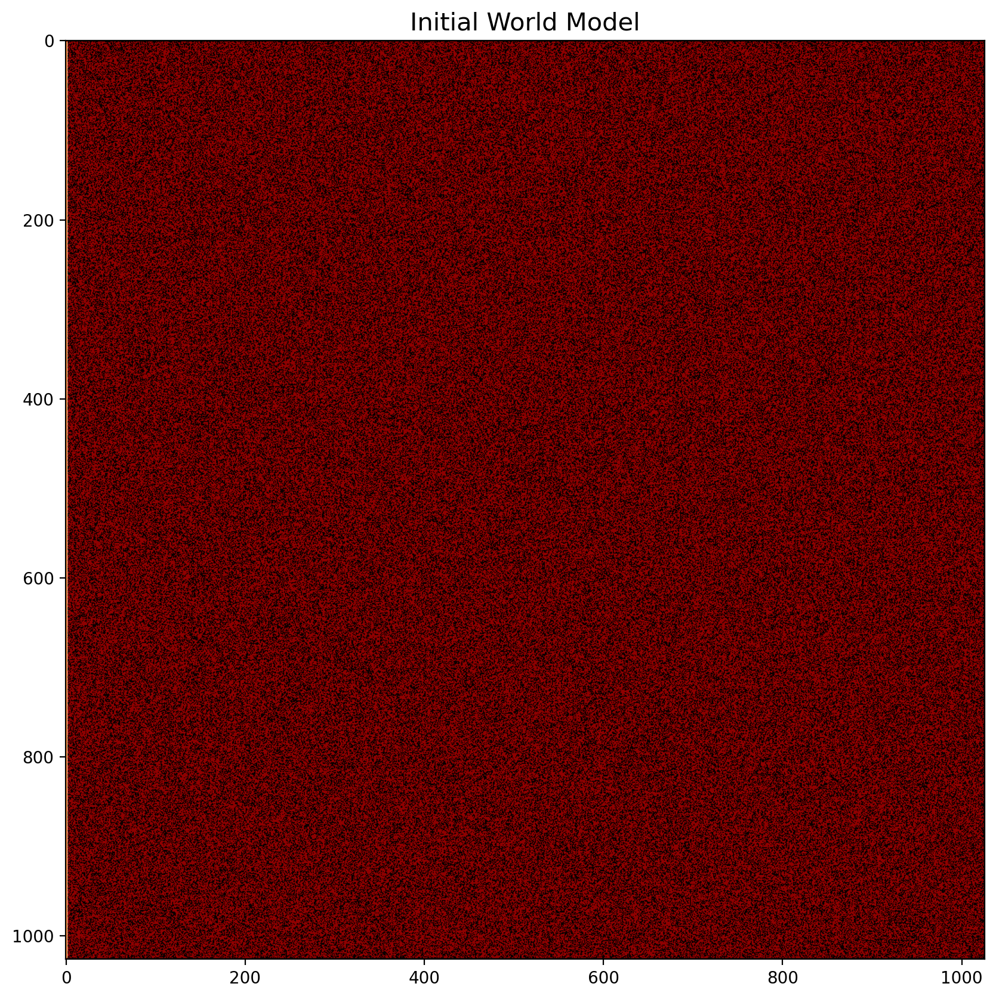

In [71]:
# Plot the grid
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(grid, cmap="hot", vmin=ground, vmax=fire)
plt.title('Initial World Model', fontsize=15)

plt.savefig("/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/ACT10/fire_initial.png", dpi = 300, bbox_inches='tight')
plt.show()

# 1000 iterations

In [ ]:
# We let the model evolve for 1000 iterations
iteration=1000
for _ in range(iteration):
    # von neumann neighborhood conditions
    will_fire[1:-1,1:-1] = ((grid[ :-2,1:-1]==fire) | (grid[1:-1, :-2]==fire)        # set cells to zero for the union of these conditions
     | (grid[1:-1,2:]==fire) | (grid[2:  ,1:-1]==fire)) & (grid[1:-1,1:-1]==tree)
    grid[grid==fire]=ground       # cell becomes ground if it turned to a fire cell
    grid[will_fire]=fire          # cell becomes fire cell if the conditions above were fulfilled
    grid[:,0] = ground            # zeroth column is still ground cells
    grid[:,size+1] = ground       # last column is still ground cells
    grid[0,:] = ground            # zeroth row is still ground cells
    grid[size+1,:] = ground       # last row is still ground cells

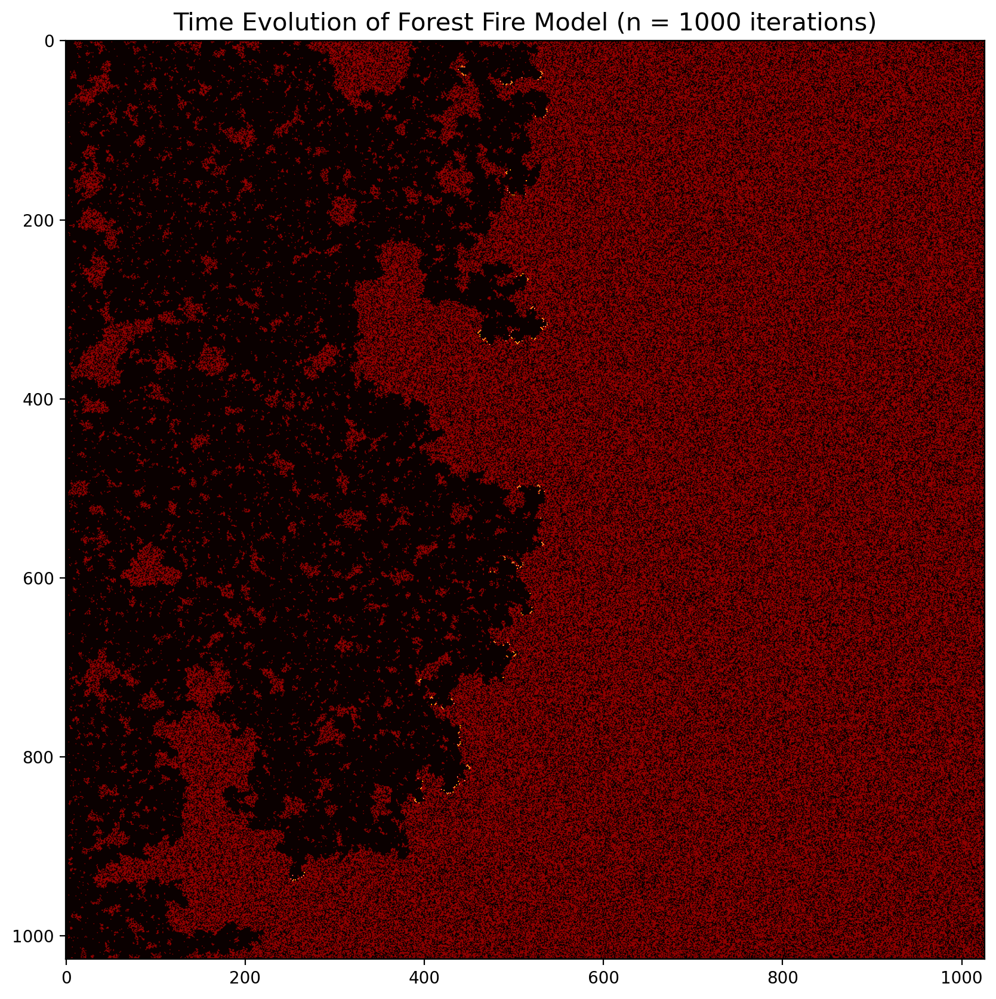

In [65]:
# Plot the time evolution of the world model
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(grid, cmap="hot", vmin=ground, vmax=fire)
plt.title('Time Evolution of Forest Fire Model (n = 1000 iterations)', fontsize = 15)

plt.savefig("/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/ACT10/evolution_fire_1000.png", dpi = 300, bbox_inches='tight')
plt.show()

# 2000 iterations

In [68]:
# We let the model evolve for 2000 iterations
iteration=2000
for _ in range(iteration):
    # von neumann neighborhood conditions
    will_fire[1:-1,1:-1] = ((grid[ :-2,1:-1]==fire) | (grid[1:-1, :-2]==fire)        # set cells to zero for the union of these conditions
     | (grid[1:-1,2:]==fire) | (grid[2:  ,1:-1]==fire)) & (grid[1:-1,1:-1]==tree)
    grid[grid==fire]=ground       # cell becomes ground if it turned to a fire cell
    grid[will_fire]=fire          # cell becomes fire cell if the conditions above were fulfilled
    grid[:,0] = ground            # zeroth column is still ground cells
    grid[:,size+1] = ground       # last column is still ground cells
    grid[0,:] = ground            # zeroth row is still ground cells
    grid[size+1,:] = ground       # last row is still ground cells

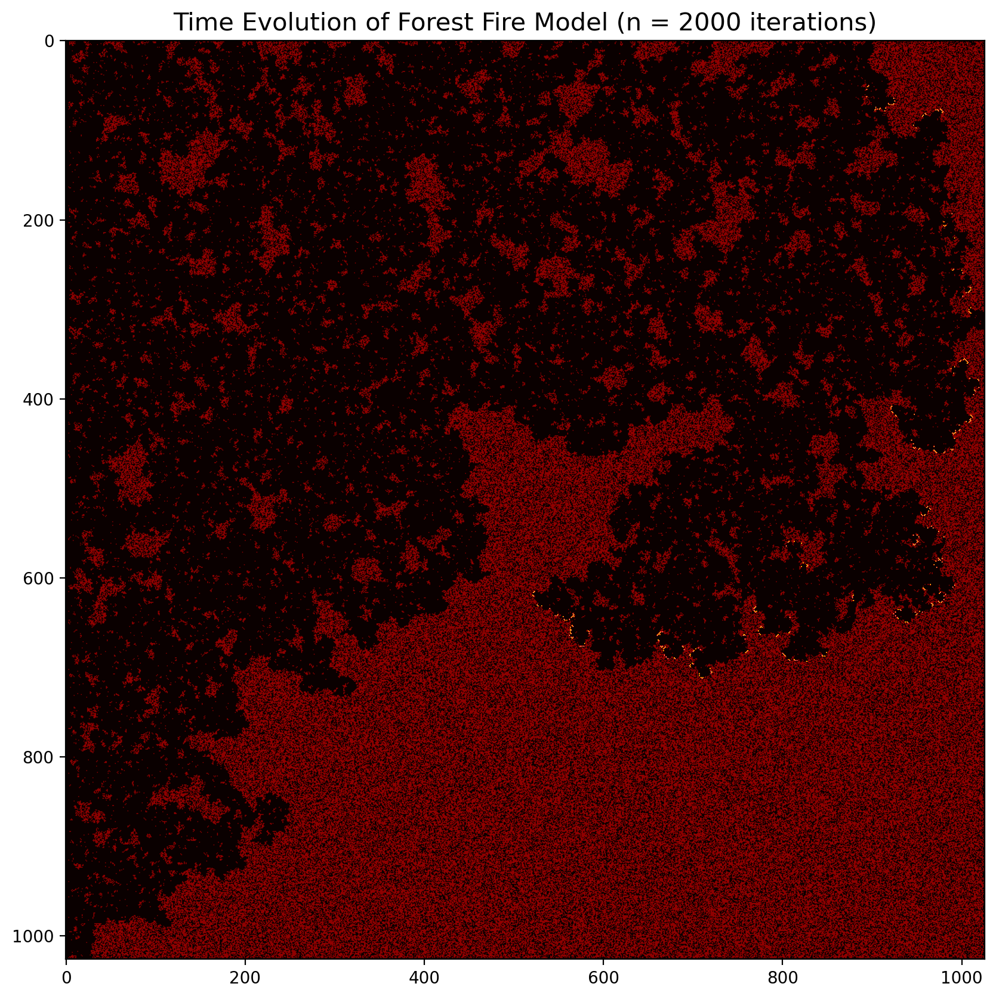

In [69]:
# Plot the time evolution of the world model
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(grid, cmap="hot", vmin=ground, vmax=fire)
plt.title('Time Evolution of Forest Fire Model (n = 2000 iterations)', fontsize = 15)

plt.savefig("/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/ACT10/evolution_fire_2000.png", dpi = 300, bbox_inches='tight')
plt.show()

# 3000 iterations

In [72]:
# We let the model evolve for 3000 iterations
iteration=3000
for _ in range(iteration):
    # von neumann neighborhood conditions
    will_fire[1:-1,1:-1] = ((grid[ :-2,1:-1]==fire) | (grid[1:-1, :-2]==fire)        # set cells to zero for the union of these conditions
     | (grid[1:-1,2:]==fire) | (grid[2:  ,1:-1]==fire)) & (grid[1:-1,1:-1]==tree)
    grid[grid==fire]=ground       # cell becomes ground if it turned to a fire cell
    grid[will_fire]=fire          # cell becomes fire cell if the conditions above were fulfilled
    grid[:,0] = ground            # zeroth column is still ground cells
    grid[:,size+1] = ground       # last column is still ground cells
    grid[0,:] = ground            # zeroth row is still ground cells
    grid[size+1,:] = ground       # last row is still ground cells

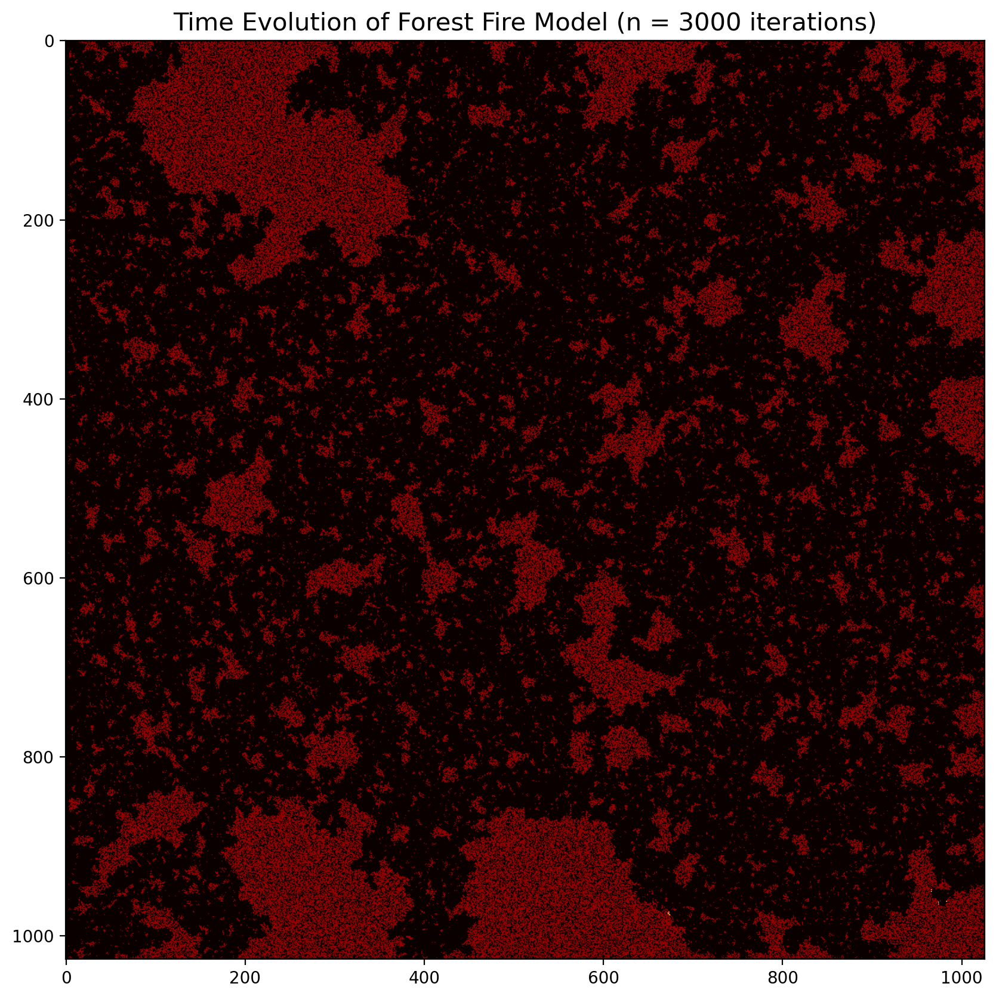

In [73]:
# Plot the time evolution of the world model
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(grid, cmap="hot", vmin=ground, vmax=fire)
plt.title('Time Evolution of Forest Fire Model (n = 3000 iterations)', fontsize = 15)

plt.savefig("/Users/Amogus/Desktop/2nd Semester (2022-2023)/App Physics 157/ACT10/evolution_fire_3000.png", dpi = 300, bbox_inches='tight')
plt.show()

# Animation

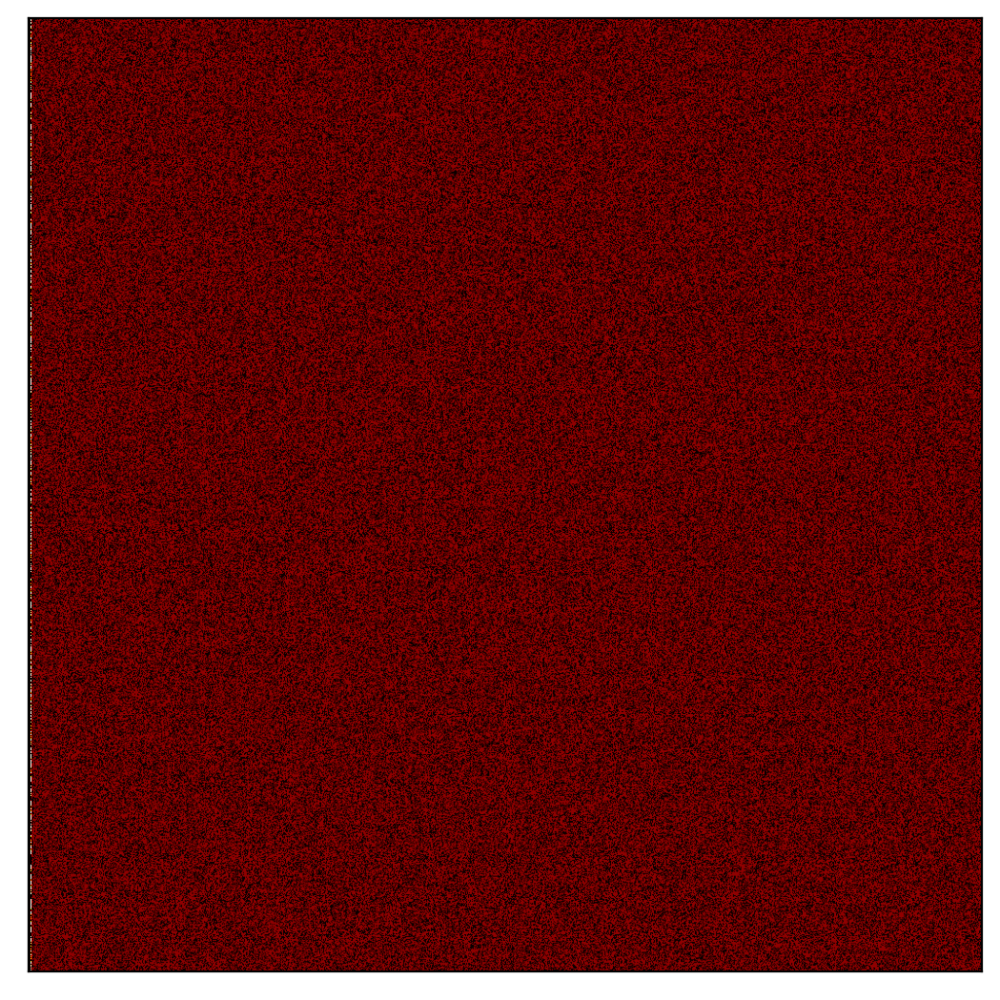

In [21]:
# We animate the time evolution of the model for 1000 iterations
size = 1024
density = 0.60

grid = np.zeros((size+2, size+2), dtype=int)
grid[np.random.uniform(0., 1., (size+2,size+2))<density] = tree
grid[:,1] = fire
grid[:,0] = ground
grid[:,size+1] = ground
grid[0,:] = ground
grid[size+1,:] = ground
will_fire = np.zeros(grid.shape, dtype=np.bool8)

# Initial world model
fig,ax = plt.subplots(figsize=(5,5))
fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=None, hspace=None)
image = ax.imshow(grid, cmap="hot", vmin=ground, vmax=fire)
plt.xticks([]), plt.yticks([])

# Animation
def update(frame):
    global grid
    will_fire[1:-1,1:-1] = ((grid[ :-2,1:-1]==fire) | (grid[1:-1, :-2]==fire)
     | (grid[1:-1,2:]==fire) | (grid[2:  ,1:-1]==fire)) & (grid[1:-1,1:-1]==tree)
    grid[grid==fire]=ground
    grid[will_fire]=fire
    grid[:,0] = ground
    grid[:,size+1] = ground
    grid[0,:] = ground
    grid[size+1,:] = ground
    image.set_data(grid)
    return image,

animation = FuncAnimation(fig, update, frames=1000, interval=20)

In [22]:
# Load the animation
video = animation.to_html5_video()
html = display.HTML(video)
display.display(html)
plt.close()